**<h1> Manipulating Images </h1>**


<h2>Objectives</h2>


In this lab, you will learn how to manipulate images, both as arrays and PIL image objects. You will learn how to copy an image to avoid aliasing. We will cover flipping images and cropping images. You will also learn to change pixel images; this will allow you to draw shapes, write text and superimpose images over other images.


<ul>
    <li><a href='#MI'>Manipulating Images </a>
        <ul>
            <li>Copying Images  </li>
            <li>Fliping Images </li>
            <li>Cropping an Image </li>
            <li>Changing Specific Image Pixels </li>
     
  
    
</ul>


----


Download the images for the lab:


In [ ]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/cat.png -O cat.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png -O lenna.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png -O baboon.png

--2026-01-16 06:48:39--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/cat.png
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)... 169.63.118.104
Connecting to cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)|169.63.118.104|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 663451 (648K) [image/png]
Saving to: ‘cat.png’

cat.png             100%[===================>] 647.90K  --.-KB/s    in 0.06s   

2026-01-16 06:48:39 (10.1 MB/s) - ‘cat.png’ saved [663451/663451]

--2026-01-16 06:48:39--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data

Tải các tệp hình ảnh xuống.

We will be using these imported functions in the lab:


In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

Nhập các thư viện cần thiết (matplotlib, PIL, numpy) để xử lý và hiển thị hình ảnh.

## Copying Images


If you want to reassign an array to another variable, you should use the `copy` method.


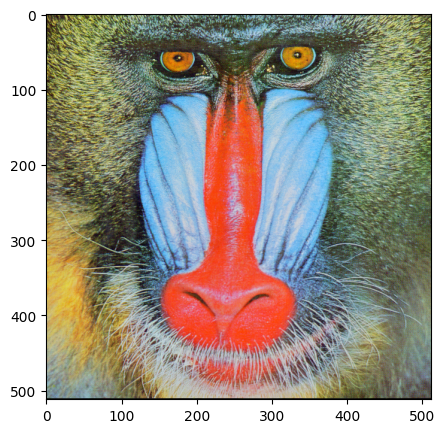

In [ ]:
baboon = np.array(Image.open('baboon.png'))
plt.figure(figsize=(5,5))
plt.imshow(baboon )
plt.show()

Mở hình ảnh 'baboon.png', chuyển đổi nó thành mảng NumPy và hiển thị.

If we do not apply the method `copy()`, the two variables would point to the same location in memory:


In [ ]:
A = baboon

Gán biến A tham chiếu đến cùng một đối tượng mảng baboon.

We use the  `id`  function to find a variable's memory address; we see the objects in the memory space which the variables `A` and `baboon` point to are the same.


In [ ]:
id(A) == id(baboon)

True

Kiểm tra xem A và baboon có trỏ đến cùng một địa chỉ bộ nhớ hay không.

However, if we apply method `copy()`, their memory addresses are different.


In [ ]:
B = baboon.copy()
id(B)==id(baboon)

False

Tạo một bản sao độc lập của mảng baboon và gán cho B, sau đó kiểm tra địa chỉ bộ nhớ.



There may be unexpected behaviours when two variables point to the same object in memory. Consider the array `baboon`. If we set all its entries to zero, all entires in `A` will become zero as well. However, as `baboon` and `B` points to different objects, the values in `B` will not be affected.


In [ ]:
baboon[:,:,] = 0

Đặt tất cả các giá trị pixel trong mảng baboon về 0 (làm cho ảnh màu đen).

We can compare the variables <code>baboon</code> and array <code>A</code>:


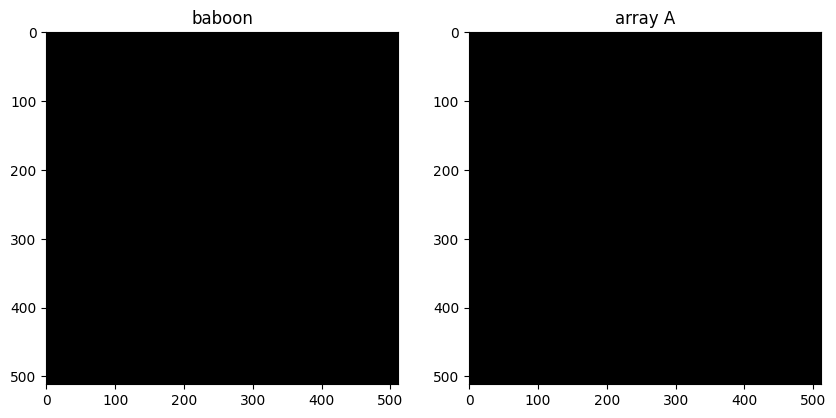

In [ ]:
plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(baboon)
plt.title("baboon")
plt.subplot(122)
plt.imshow(A)
plt.title("array A")
plt.show()

Hiển thị hình ảnh `baboon` và `A` để chứng minh hiện tượng 'aliasing'.


We see they are the same. This behaviour is called aliasing. Aliasing happens whenever one variable's value is assigned to another variable. Variables are references to values on the memory.

We can also compare <code>baboon</code> and array <code>B</code>:


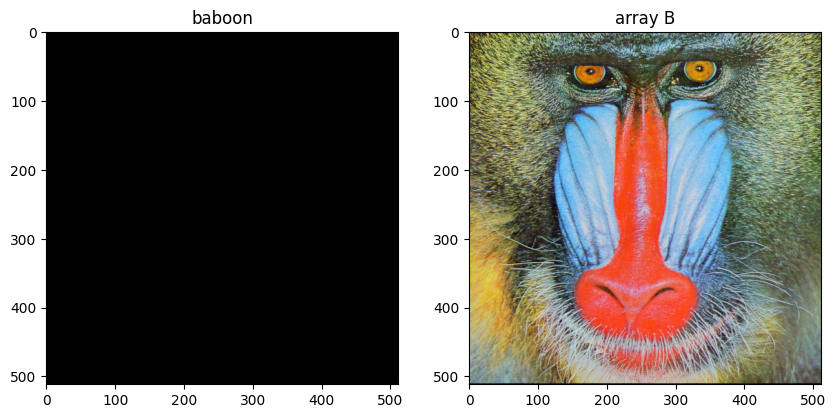

In [ ]:
plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(baboon)
plt.title("baboon")
plt.subplot(122)
plt.imshow(B)
plt.title("array B")
plt.show()

Hiển thị hình ảnh baboon và B để chứng minh rằng B là một bản sao độc lập.


If a PIL function does not return a new image, the same principle applies. We will go over some examples later on.


## Flipping Images


Flipping images involves reordering the indices of the pixels such that it changes the orientation of the image. Consider the following image:


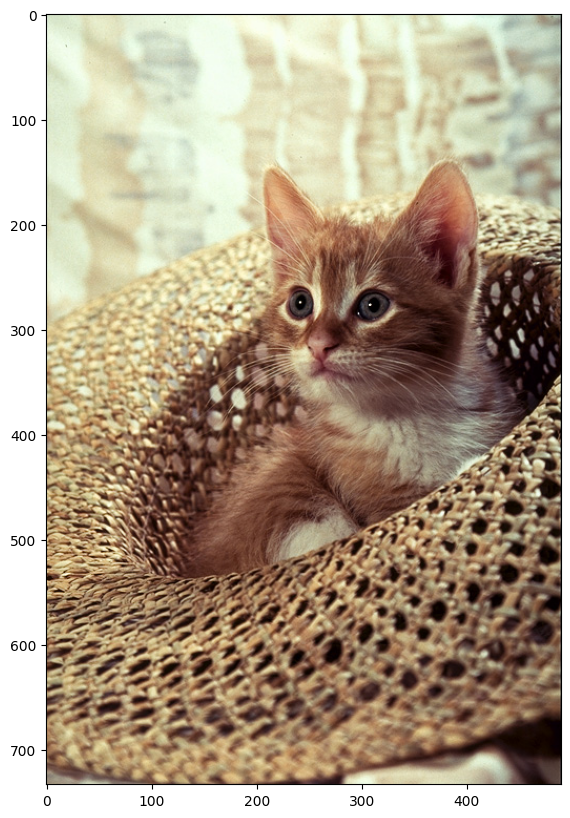

In [ ]:
image = Image.open("cat.png")
plt.figure(figsize=(10,10))
plt.imshow(image)
plt.show()

Mở hình ảnh 'cat.png' và hiển thị.

We can cast it to an array and find its shape:


In [ ]:
array = np.array(image)
width, height, C = array.shape
print('width, height, C', width, height, C)

width, height, C 733 490 3


Chuyển đổi hình ảnh thành mảng NumPy và in kích thước của nó (chiều rộng, chiều cao, kênh màu).

Let's flip, i.e rotate vertically, the image. Let's try the traditional approach. First, we create an array of the same size with datatype <code>np.uint8</code>.


In [ ]:
array_flip = np.zeros((width, height, C), dtype=np.uint8)

Tạo một mảng mới với cùng kích thước, được điền bằng các số 0, để lưu trữ hình ảnh lật.

We assign the first row of pixels of the original array to the new array’s last row. We repeat the process for every row, incrementing the row number from the original array and decreasing the new array’s row index to assign the pixels accordingly. After excecuting the for loop below, `array_flip` will become the flipped image.


In [ ]:
for i,row in enumerate(array):
    array_flip[width - 1 - i, :, :] = row

Lật hình ảnh theo chiều dọc bằng cách lặp qua các hàng pixel và gán ngược lại.

<code>PIL</code> has several ways to flip an image, for example, we can use the <code>ImageOps</code> module:


In [ ]:
from PIL import ImageOps

Nhập mô-đun ImageOps từ thư viện PIL để thực hiện các thao tác trên hình ảnh.

The `flip()` method of `ImageOps` module flips the image. The `mirror()` method will mirror  the image:


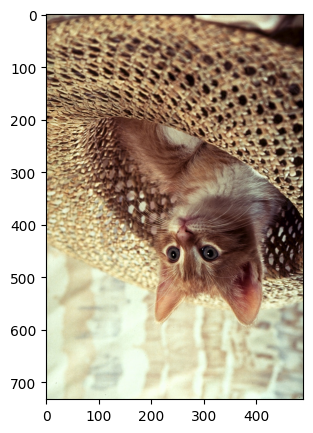

In [ ]:
im_flip = ImageOps.flip(image)
plt.figure(figsize=(5,5))
plt.imshow(im_flip)
plt.show()

Lật hình ảnh theo chiều dọc bằng hàm ImageOps.flip() và hiển thị.

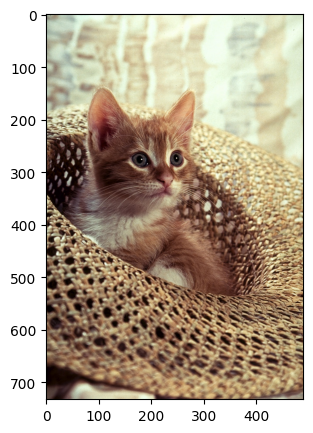

In [ ]:
im_mirror = ImageOps.mirror(image)
plt.figure(figsize=(5,5))
plt.imshow(im_mirror)
plt.show()

Phản chiếu hình ảnh theo chiều ngang bằng hàm ImageOps.mirror() và hiển thị.

We can use  the <code>transpose()</code> method; the parameter is an integer indicating what type of transposition we would like to perform. For example, we can flip the image using a value of `1`.


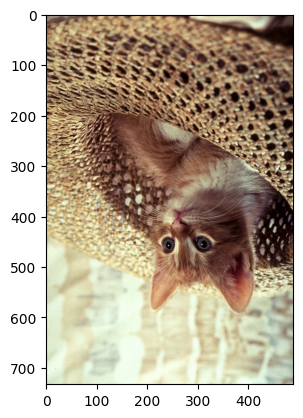

In [ ]:
im_flip = image.transpose(1)
plt.imshow(im_flip)
plt.show()

Lật hình ảnh bằng phương thức transpose() của đối tượng hình ảnh PIL và hiển thị.

The Image module has built-in attributes that describe the type of flip. The values are just integers. Several are shown in the following <code>dict</code>:


In [ ]:
flip = {"FLIP_LEFT_RIGHT": Image.FLIP_LEFT_RIGHT,
        "FLIP_TOP_BOTTOM": Image.FLIP_TOP_BOTTOM,
        "ROTATE_90": Image.ROTATE_90,
        "ROTATE_180": Image.ROTATE_180,
        "ROTATE_270": Image.ROTATE_270,
        "TRANSPOSE": Image.TRANSPOSE,
        "TRANSVERSE": Image.TRANSVERSE}

Định nghĩa một từ điển chứa các hằng số tích hợp sẵn của PIL để thực hiện các phép biến đổi hình ảnh khác nhau.

We see the values are integers.


In [ ]:
flip["FLIP_LEFT_RIGHT"]

0

Hiển thị giá trị số nguyên của hằng số FLIP_LEFT_RIGHT.

We can plot each of the outputs using the different  parameter values:


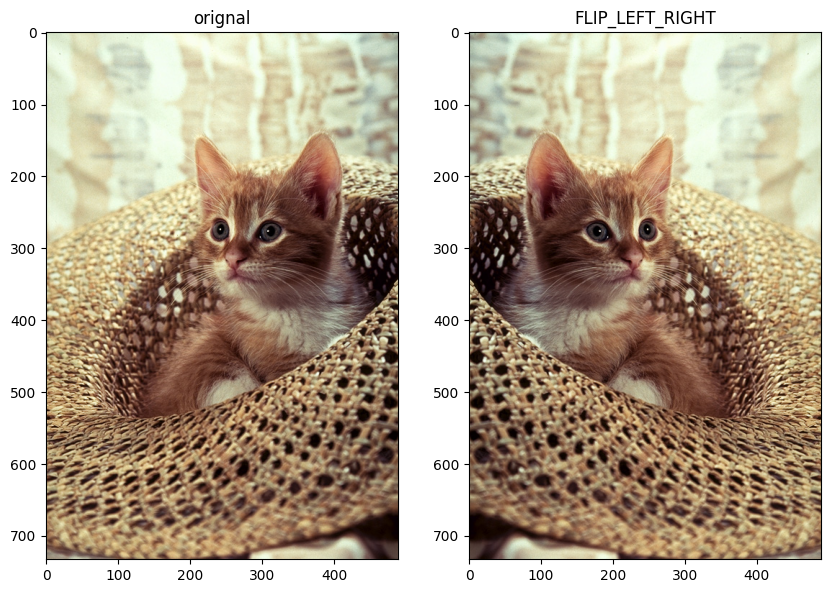

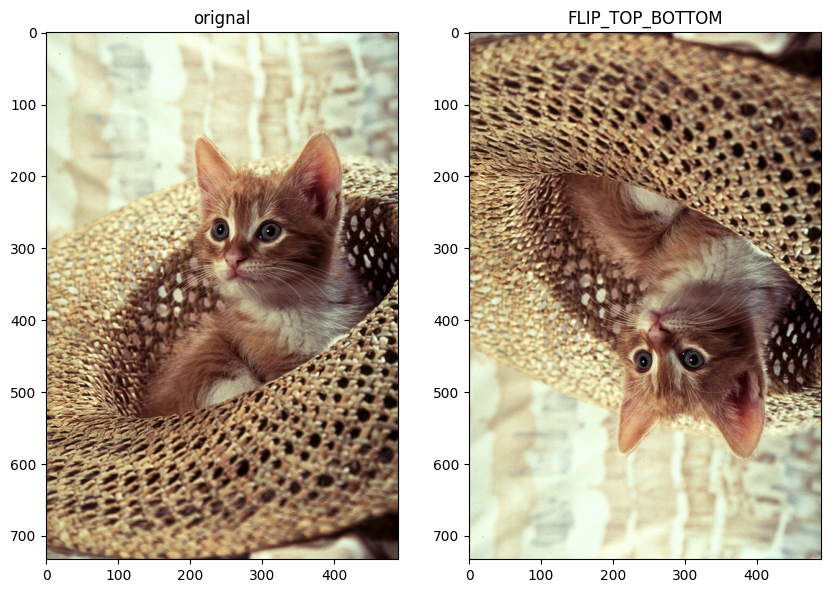

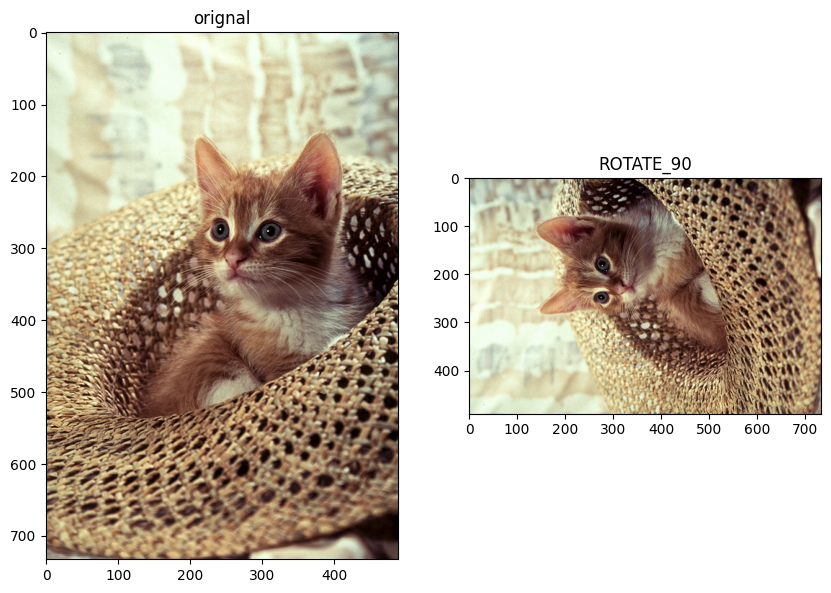

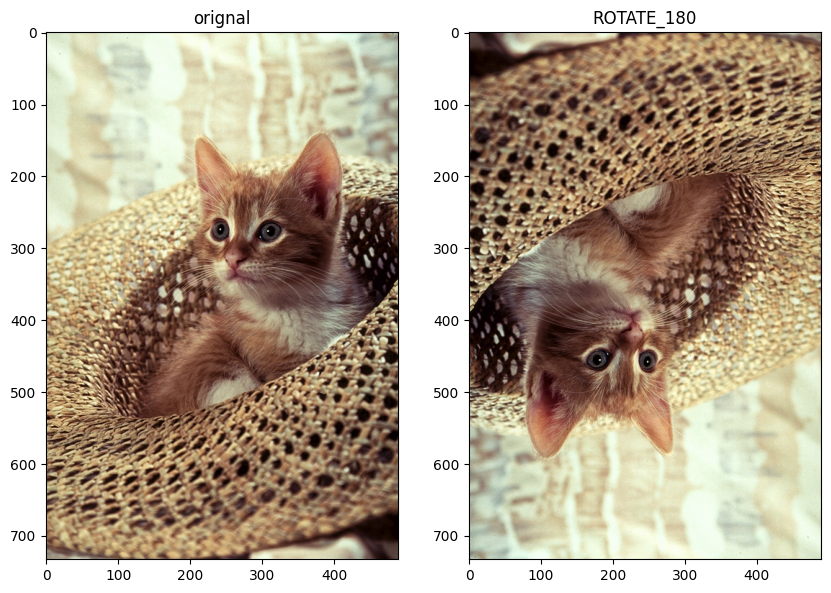

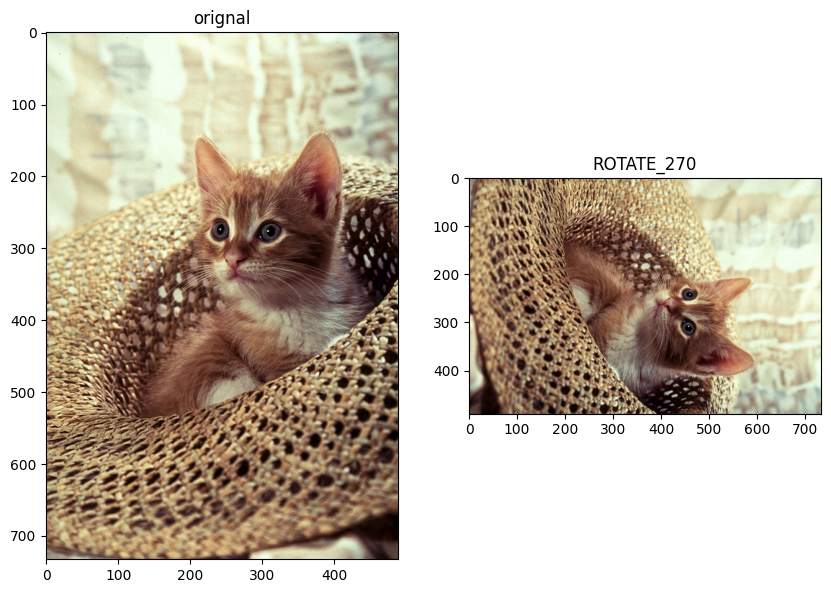

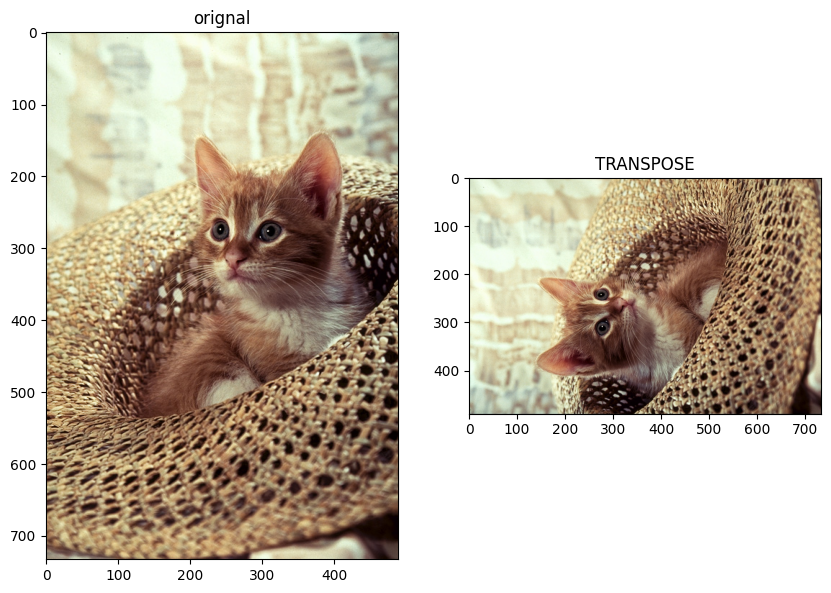

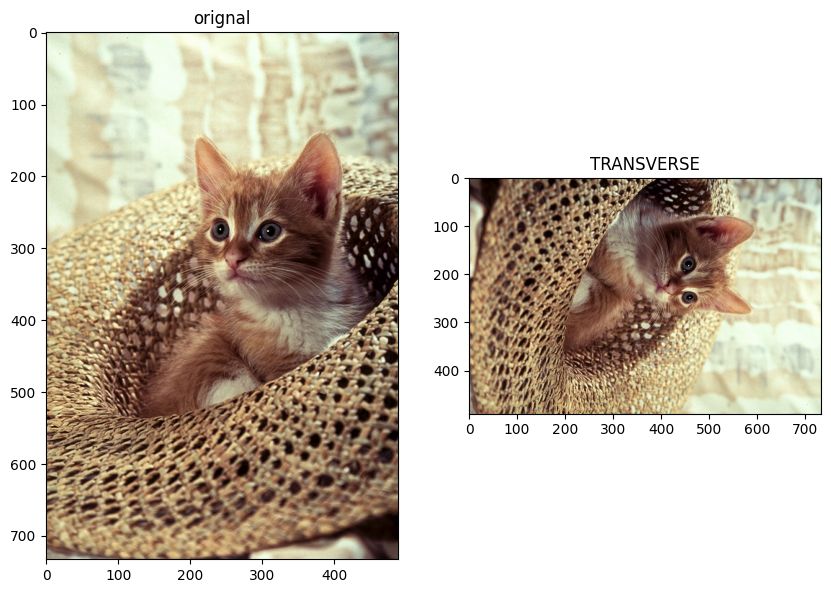

In [ ]:
for key, values in flip.items():
    plt.figure(figsize=(10,10))
    plt.subplot(1,2,1)
    plt.imshow(image)
    plt.title("orignal")
    plt.subplot(1,2,2)
    plt.imshow(image.transpose(values))
    plt.title(key)
    plt.show()

Hiển thị hình ảnh gốc và hình ảnh đã biến đổi cho từng kiểu lật/xoay khác nhau được định nghĩa trong từ điển flip.

 ## Cropping an Image


Cropping is the act of "cutting out" a part of an image and throwing out the rest. We can perform cropping using array slicing.

Let start with a vertical crop: the variable `upper` is the index of the first row that we would like to include in the image, the variable `lower` is the index of the last row we would like to include. We then perform array slicing to obtain the new image.


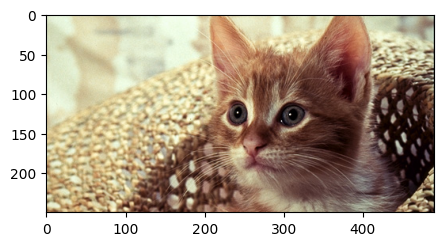

In [ ]:
upper = 150
lower = 400
crop_top = array[upper: lower,:,:]
plt.figure(figsize=(5,5))
plt.imshow(crop_top)
plt.show()

Cắt một phần hình ảnh theo chiều dọc bằng cách sử dụng cắt mảng NumPy và hiển thị.

Consider the array `crop_top`: we can also crop horizontally. The variable `right` is the index of the first column that we would like to include in the image and the variable `left` is the index of the last column we would like to include in the image.


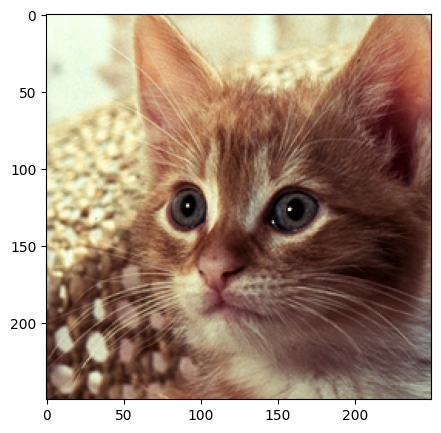

In [ ]:
left = 150
right = 400
crop_horizontal = crop_top[: ,left:right,:]
plt.figure(figsize=(5,5))
plt.imshow(crop_horizontal)
plt.show()

Cắt một phần hình ảnh theo chiều ngang từ hình ảnh đã cắt trước đó và hiển thị.

You can crop the PIL image using the <code>crop()</code> method, using the parameters from above Set the cropping area with <code>box=(left, upper, right, lower)</code>.


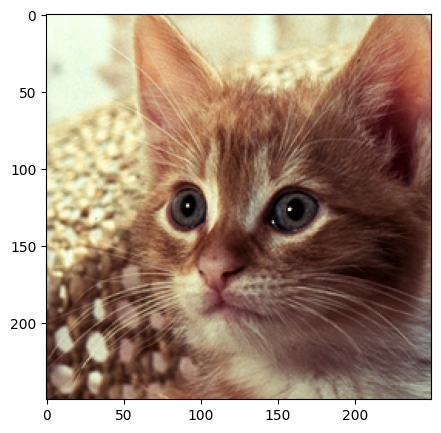

In [ ]:
image = Image.open("cat.png")
crop_image = image.crop((left, upper, right, lower))
plt.figure(figsize=(5,5))
plt.imshow(crop_image)
plt.show()

Cắt hình ảnh PIL bằng phương thức crop() và hiển thị.

We can also flip the new image:


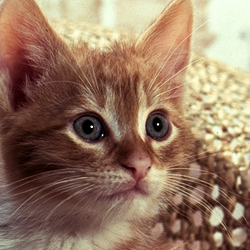

In [ ]:
crop_image = crop_image.transpose(Image.FLIP_LEFT_RIGHT)
crop_image

Lật hình ảnh đã cắt theo chiều ngang và hiển thị đối tượng hình ảnh.

## Changing Specific Image Pixels


We can change specific image pixels using  array indexing; for example, we can set  all the green and blue channels in the original image we cropped to zero:


In [ ]:
array_sq = np.copy(array)
array_sq[upper:lower, left:right, 1:3] = 0

Tạo một bản sao của mảng hình ảnh và đặt các kênh màu xanh lá cây và xanh lam của một vùng cụ thể về 0.

We can compare the results with the new image.


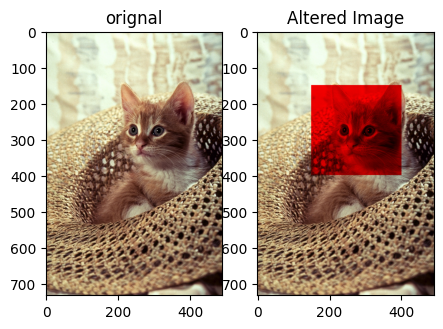

In [ ]:
plt.figure(figsize=(5,5))
plt.subplot(1,2,1)
plt.imshow(array)
plt.title("orignal")
plt.subplot(1,2,2)
plt.imshow(array_sq)
plt.title("Altered Image")
plt.show()

Hiển thị hình ảnh gốc và hình ảnh đã thay đổi kênh màu để so sánh.

We can also use the `ImageDraw` module from `PIL` library, which provides simple 2D graphics for Image objects


In [ ]:
from PIL import ImageDraw

Nhập mô-đun ImageDraw từ thư viện PIL để vẽ lên hình ảnh.

We will copy the image object:


In [ ]:
image_draw = image.copy()

Tạo một bản sao của đối tượng hình ảnh để vẽ lên đó.

The draw constructor creates an object that can be used to draw in the given image. The input <code>im</code> is the image we would like to draw in.



In [ ]:
image_fn = ImageDraw.Draw(im=image_draw)

Tạo một đối tượng ImageDraw để vẽ trên bản sao hình ảnh.

Whatever method we apply to the object <code>image_fn</code>, will change the image object <code>image_draw</code>.


We can draw a rectangle using the <code>rectangle</code> function, two important parameters include: <code>xy</code> – the coordinates bounding box  and <code>fill</code> – Color of the rectangle.


In [ ]:
shape = [left, upper, right, lower]
image_fn.rectangle(xy=shape,fill="red")

Vẽ một hình chữ nhật màu đỏ lên hình ảnh.

We can plot the image.


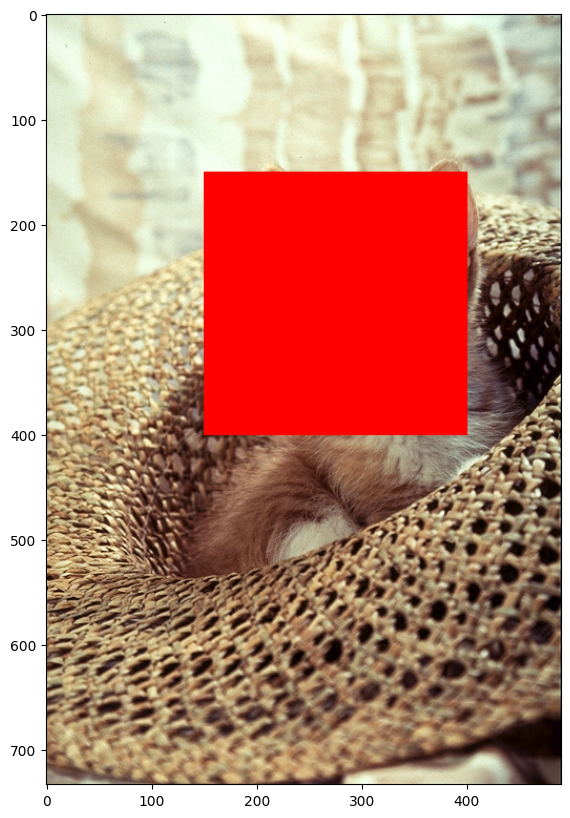

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(image_draw)
plt.show()

Hiển thị hình ảnh với hình chữ nhật đã vẽ.

There are other shapes we can use. For example, we can also overlay text on an image: we use the ImageFont module to obtain  bitmap fonts.


In [ ]:
from PIL import ImageFont

Nhập mô-đun ImageFont từ thư viện PIL để sử dụng phông chữ.

We use the text method to place the text on the image. The parameters include `xy` (the top-left anchor coordinates of the text), the parameter `text` (the text to be drawn), and `fill` (the color to use for the text).


In [ ]:
image_fn.text(xy=(0,0),text="box",fill=(0,0,0))

Viết văn bản 'box' lên hình ảnh tại tọa độ (0,0) với màu đen.

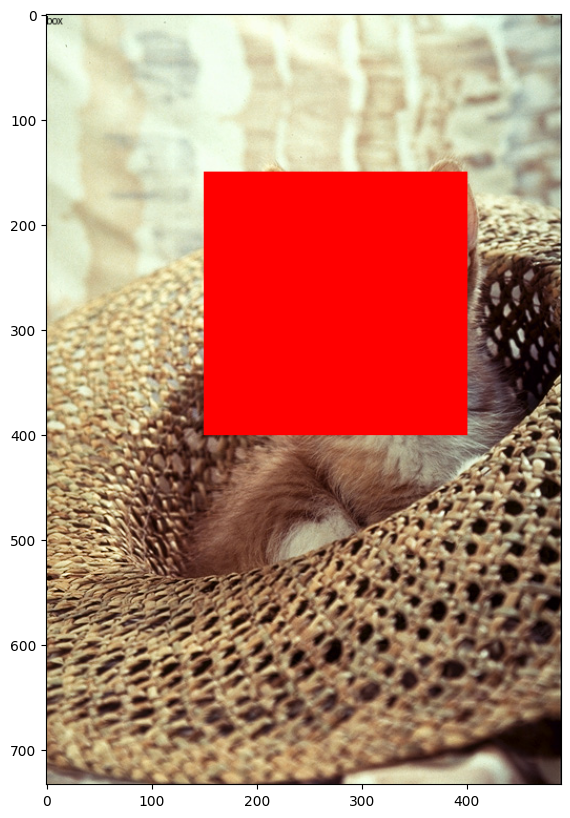

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(image_draw)
plt.show()

Hiển thị hình ảnh với văn bản đã được thêm vào.

We can overlay or paste one image over another by reassigning the pixel for one array to the next. Consider the following image array:


In [ ]:
image_lenna = Image.open("lenna.png")
array_lenna = np.array(image_lenna)

Mở hình ảnh 'lenna.png' và chuyển đổi nó thành mảng NumPy.

We can reassign the pixel values as follows:


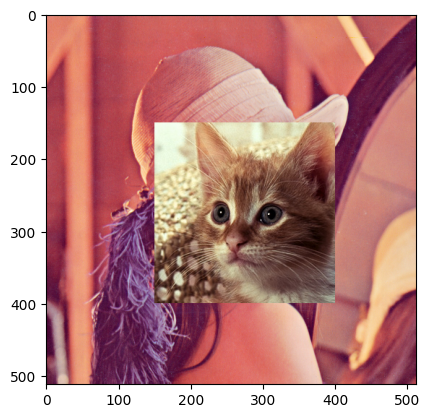

In [ ]:
array_lenna[upper:lower,left:right,:]=array[upper:lower,left:right,:]
plt.imshow(array_lenna)
plt.show()

Chèn một phần của hình ảnh 'cat' vào hình ảnh 'lenna' bằng cách gán lại các giá trị pixel trong mảng.

In the same manner, the <code>paste()</code> method allows you to overlay one image over another, with the input being the image you would like to overlay. The parameter box is the left and upper coordinate of the image:


In [ ]:
image_lenna.paste(crop_image, box=(left,upper))

Dán hình ảnh đã cắt (crop_image) lên hình ảnh 'lenna' tại một vị trí cụ thể.

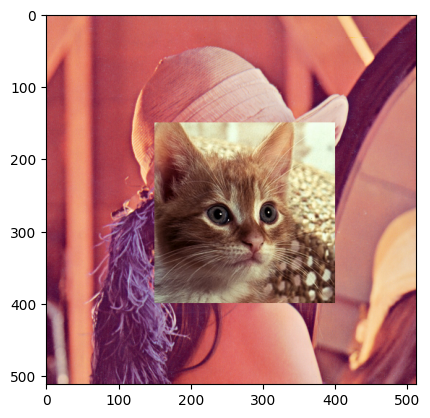

In [ ]:
plt.imshow(image_lenna)
plt.show()

Hiển thị hình ảnh 'lenna' sau khi đã dán hình ảnh đã cắt.

We can see the method `copy()` applies to some <code>PIL</code> objects. We create two image objects, we set `new_image` to the `image`, and we use the method `copy()` for the `copy_image` object.


In [ ]:
image = Image.open("cat.png")
new_image=image
copy_image=image.copy()

Mở hình ảnh 'cat.png' và tạo hai biến tham chiếu: một trực tiếp và một bản sao.

Like the array, we see that the same memory address relationship exists. For example, if we don't use the method `copy()`, the image object has the same memory address as the original PIL image object.


In [ ]:
id(image)==id(new_image)

True

Kiểm tra xem image và new_image có trỏ đến cùng một địa chỉ bộ nhớ hay không.



If we use the method <code>copy()</code>, the address is different:


In [ ]:
id(image)==id(copy_image)

False

Kiểm tra xem image và copy_image có trỏ đến cùng một địa chỉ bộ nhớ hay không.

If we change the object <code>image</code>, <code>new_image</code> will change, but <code>copy_image</code> will remain the same:


In [ ]:
image_fn= ImageDraw.Draw(im=image)
image_fn.text(xy=(0,0),text="box",fill=(0,0,0))
image_fn.rectangle(xy=shape,fill="red")

Vẽ văn bản và hình chữ nhật trực tiếp lên đối tượng image gốc.

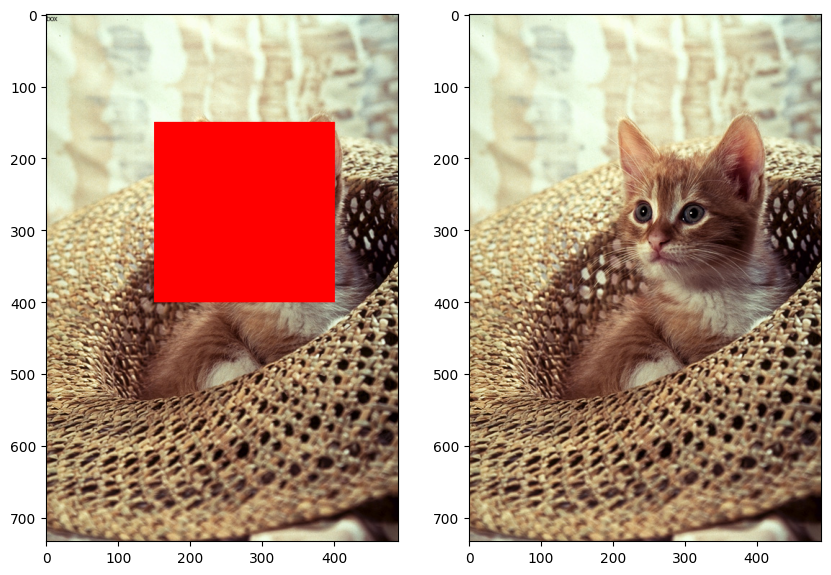

In [ ]:
plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(new_image)
plt.subplot(122)
plt.imshow(copy_image)
plt.show()

Hiển thị new_image (đã thay đổi do aliasing) và copy_image (không thay đổi) để minh họa sự khác biệt.



### Question 1:
Use the image `baboon.png` from this lab or take any image you like.

Open the image and create a PIL Image object called `im`, flip `im` and create an image called `im_flip`. Mirror `im` and create an image called `im_mirror`. Finally, plot both images.


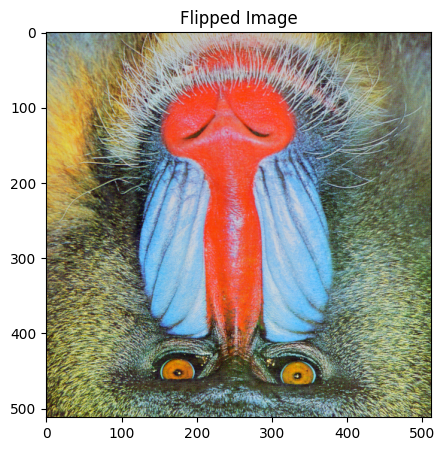

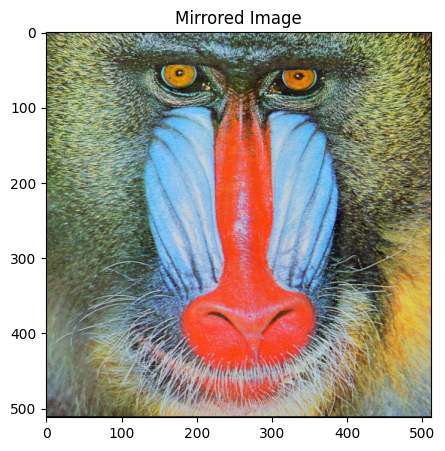

In [ ]:
im = Image.open("baboon.png")

im_flip = ImageOps.flip(im)
plt.figure(figsize=(5,5))
plt.imshow(im_flip)
plt.title("Flipped Image")
plt.show()

im_mirror = ImageOps.mirror(im)
plt.figure(figsize=(5,5))
plt.imshow(im_mirror)
plt.title("Mirrored Image")
plt.show()

Double-click **here** for a hint.

<!-- The hint is below:

im_flip = ImageOps.flip(im)
im_mirror = ImageOps.mirror(im)

-->


Double-click **here** for the solution.

<!-- The answer is below:

im = Image.open("lenna.png")

im_flip = ImageOps.flip(im)
plt.figure(figsize=(5,5))
plt.imshow(im_flip)
plt.show()

im_mirror = ImageOps.mirror(im)
plt.figure(figsize=(5,5))
plt.imshow(im_mirror)
plt.show()

-->


# References


[1]  Images were taken from: https://homepages.cae.wisc.edu/~ece533/images/
    
[2]  <a href='https://pillow.readthedocs.io/en/stable/index.html'>Pillow Docs</a>

[3]  <a href='https://opencv.org/'>Open CV</a>

[4] Gonzalez, Rafael C., and Richard E. Woods. "Digital image processing." (2017).


<!--<h2>Change Log</h2>-->
